# VEATIC


In [ ]:
import os
import pandas as pd

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
file_path_videos = '/content/drive/MyDrive/PRS Sem 2 Project/VEATIC/videos'
file_path_annotations = '/content/drive/MyDrive/PRS Sem 2 Project/VEATIC/rating_averaged'

In [5]:
# Iterate through video files
for i in range(len(os.listdir(file_path_videos))):
    video_filename = f"{i}.mp4"
    arousal_filename = f"{i}_arousal.csv"
    valence_filename = f"{i}_valence.csv"

    video_path = os.path.join(file_path_videos, video_filename)
    arousal_path = os.path.join(file_path_annotations, arousal_filename)
    valence_path = os.path.join(file_path_annotations, valence_filename)

    try:
        # Read the arousal CSV without a header and assign column names
        arousal_df = pd.read_csv(arousal_path, header=None)
        arousal_df.columns = ['frame', 'arousal']
        # Read the valence CSV without a header and assign column names
        valence_df = pd.read_csv(valence_path, header=None)
        valence_df.columns = ['frame', 'valence']

        # Merge the arousal and valence dataframes on the 'frame' column
        combined_df = pd.merge(arousal_df, valence_df, on='frame', how='inner')

        # For demonstration, let's display the head of the combined dataframe for the first video
        if i == 0:
            print(f"Successfully read and combined data for video {i}:")
            display(combined_df.head())

    except FileNotFoundError:
        print(f"Annotation file not found for video {i}: {arousal_filename} or {valence_filename}")
    except Exception as e:
        print(f"Error processing annotation files for video {i}: {e}")

Successfully read and combined data for video 0:


,frame,arousal,valence
0,0,-0.103276,-0.078409
1,1,0.036604,-0.057157
2,2,0.006550,-0.055426
3,3,0.023513,-0.045487
4,4,0.005149,-0.029783


In [15]:
import os
import pandas as pd

def process_video_annotations(file_path_videos, file_path_annotations):
    video_data_list = []

    # Get all MP4 files and process them
    video_files = [f for f in os.listdir(file_path_videos) if f.endswith(".mp4")]

    for video_filename in video_files:
        video_basename = os.path.splitext(video_filename)[0]

        # Construct file paths
        arousal_path = os.path.join(file_path_annotations, f"{video_basename}_arousal.csv")
        valence_path = os.path.join(file_path_annotations, f"{video_basename}_valence.csv")

        try:
            # Read annotation files
            arousal_df = pd.read_csv(arousal_path, header=None, names=['frame', 'arousal'])
            valence_df = pd.read_csv(valence_path, header=None, names=['frame', 'valence'])

            # Calculate statistics
            video_data = {
                'video_filename': video_filename,
                'video_basename': video_basename,
                'length_frames': len(arousal_df),
                'min_arousal': arousal_df['arousal'].min(),
                'max_arousal': arousal_df['arousal'].max(),
                'mean_arousal': arousal_df['arousal'].mean(),
                'std_arousal': arousal_df['arousal'].std(),
                'min_valence': valence_df['valence'].min(),
                'max_valence': valence_df['valence'].max(),
                'mean_valence': valence_df['valence'].mean(),
                'std_valence': valence_df['valence'].std(),
            }

            video_data_list.append(video_data)

            # Print progress for first few files

        except FileNotFoundError as e:
            print(f"✗ Missing annotation files for {video_basename}")
        except Exception as e:
            print(f"✗ Error processing {video_basename}: {str(e)}")

    # Convert to DataFrame
    if video_data_list:
        df = pd.DataFrame(video_data_list)
        return df

# Usage example:
video_stats_df = process_video_annotations(file_path_videos, file_path_annotations)
#
# Display results
display(video_stats_df)
print(f"\nDataset contains {len(video_stats_df)} videos")
print(f"Total frames: {video_stats_df['length_frames'].sum():,}")
print(f"Average video length: {video_stats_df['length_frames'].mean():.1f} frames")

,video_filename,video_basename,length_frames,min_arousal,max_arousal,mean_arousal,std_arousal,min_valence,max_valence,mean_valence,std_valence
0,52.mp4,52,264,-0.014127,0.131325,0.082456,0.035610,-0.051083,0.387467,0.261198,0.135131
1,20.mp4,20,453,-0.047570,0.078317,0.021443,0.028452,-0.330268,0.028298,-0.190363,0.097483
2,19.mp4,19,720,-0.092745,0.166434,0.039417,0.030269,-0.344911,0.160777,0.020851,0.150453
3,8.mp4,8,1050,-0.189814,0.060055,-0.128385,0.050193,-0.232535,0.028776,-0.164091,0.050732
4,12.mp4,12,716,-0.081080,0.415297,0.173612,0.170937,-0.206889,0.147216,-0.075627,0.092759
...,...,...,...,...,...,...,...,...,...,...,...
119,42.mp4,42,2160,-0.057449,0.282965,0.150324,0.092829,-0.417503,0.000869,-0.248201,0.126323
120,56.mp4,56,2745,-0.364278,0.321366,-0.077460,0.226633,-0.502104,-0.010052,-0.333491,0.126820
121,4.mp4,4,1454,-0.074929,0.716868,0.372552,0.183078,-0.703304,0.015341,-0.451800,0.167428
122,57.mp4,57,1896,-0.087646,0.180061,0.052487,0.073626,-0.290496,0.366022,-0.045307,0.217420



Dataset contains 124 videos
Total frames: 257,601
Average video length: 2077.4 frames


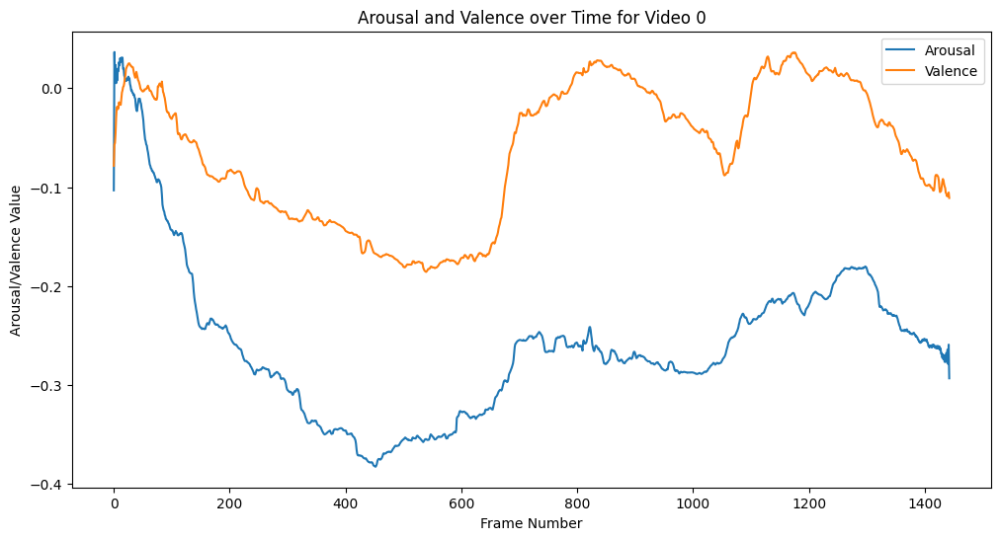

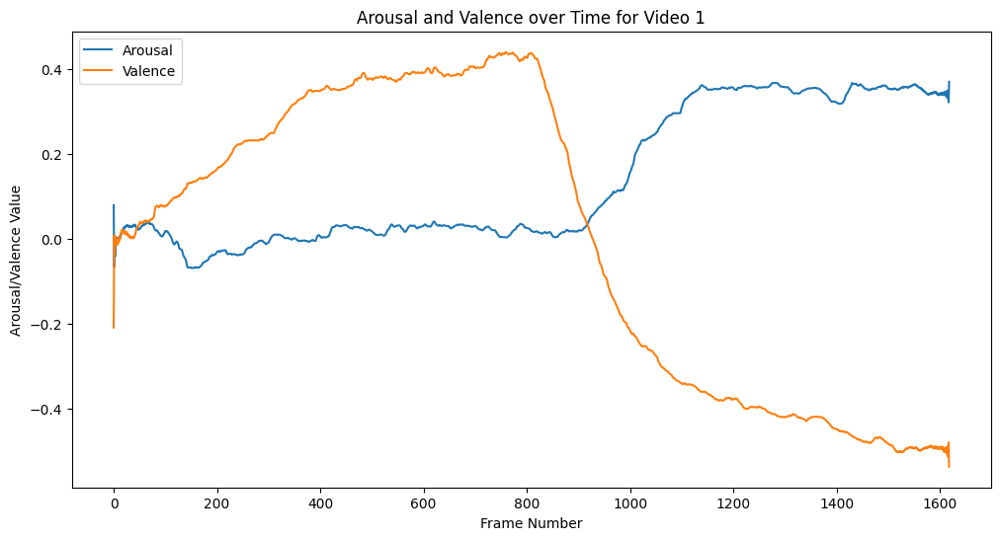

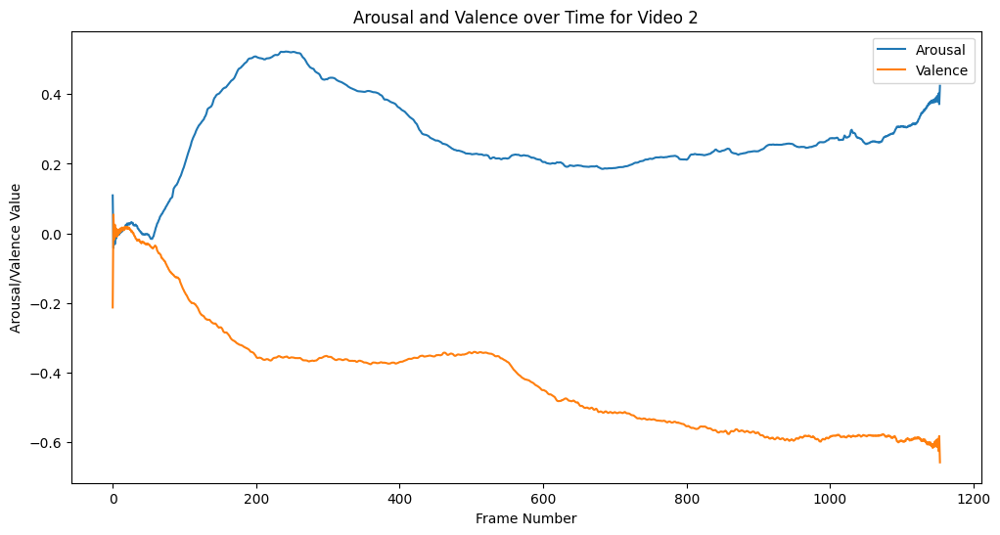

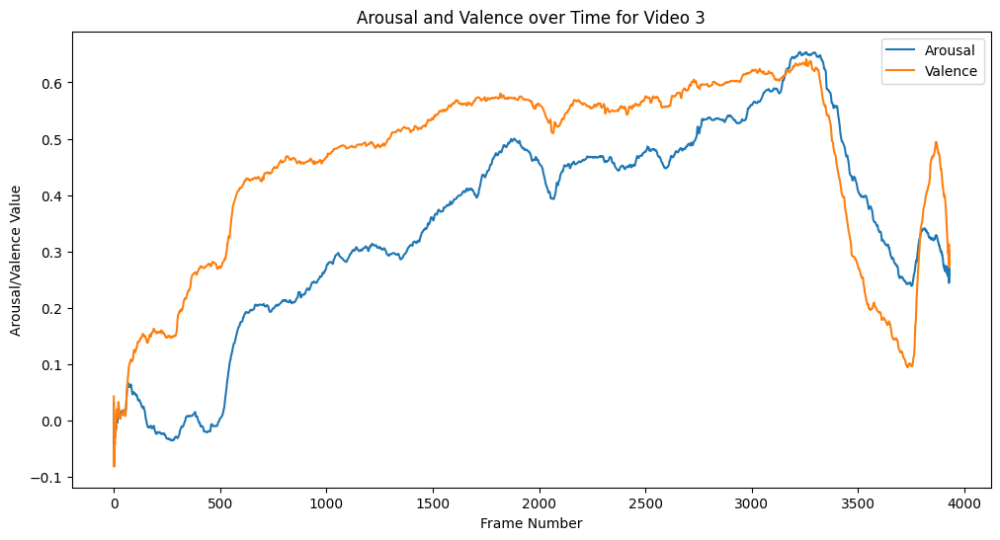

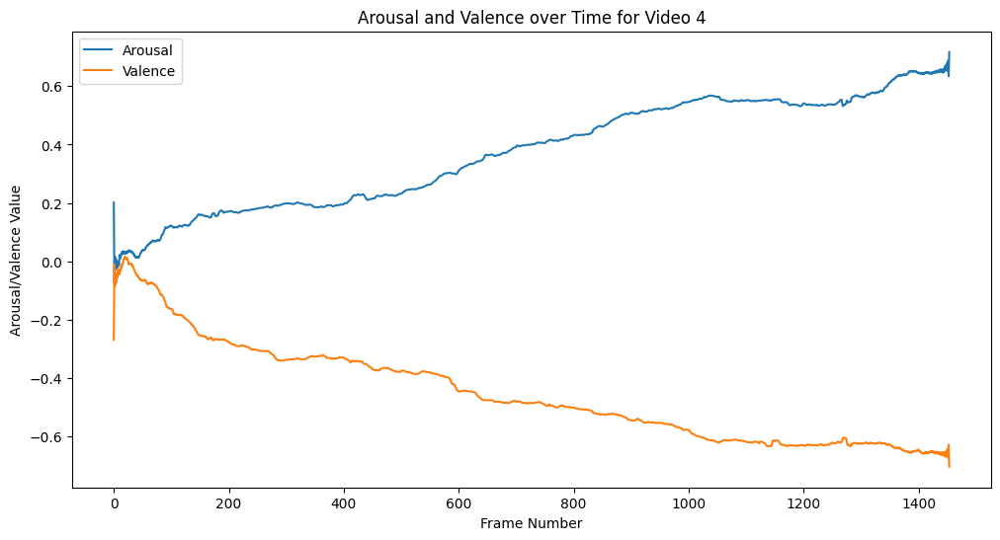

...

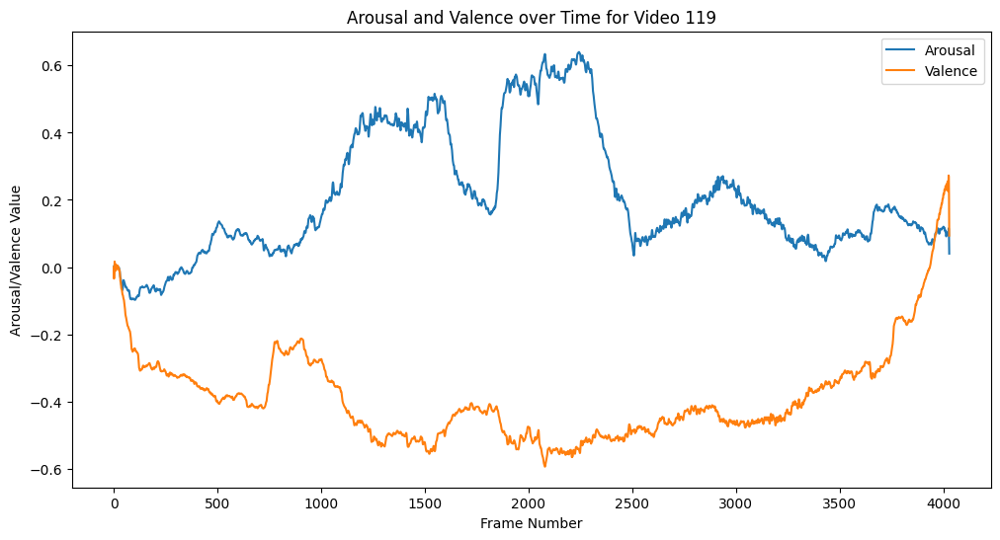

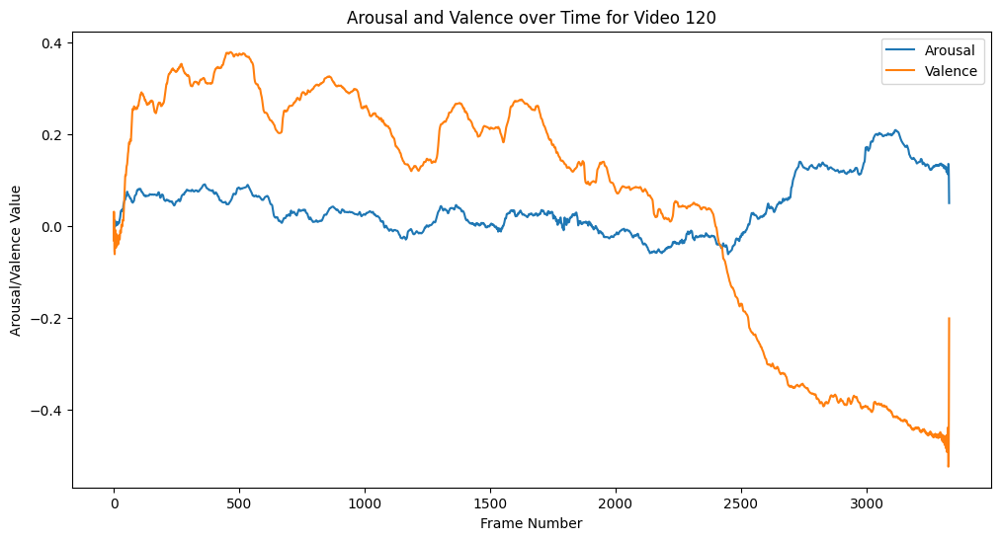

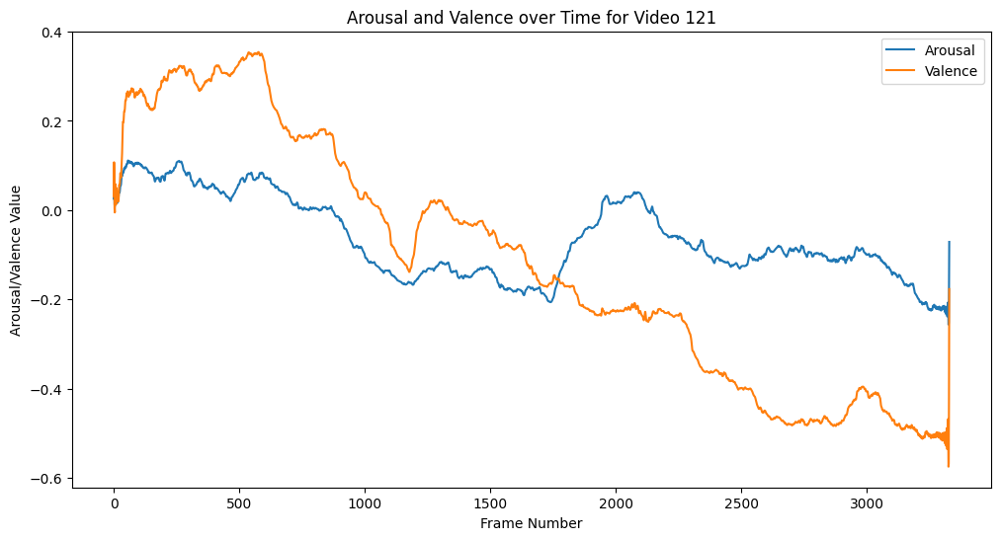

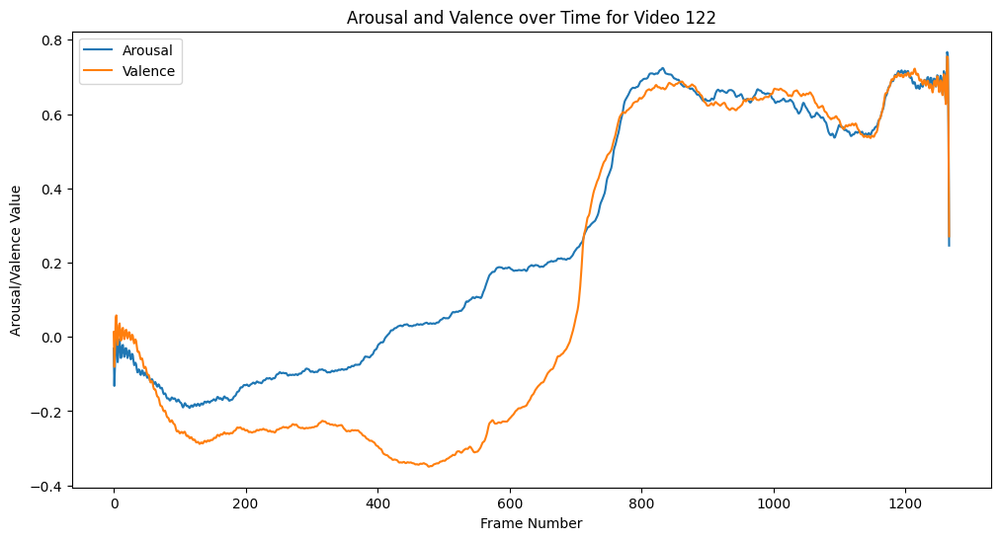

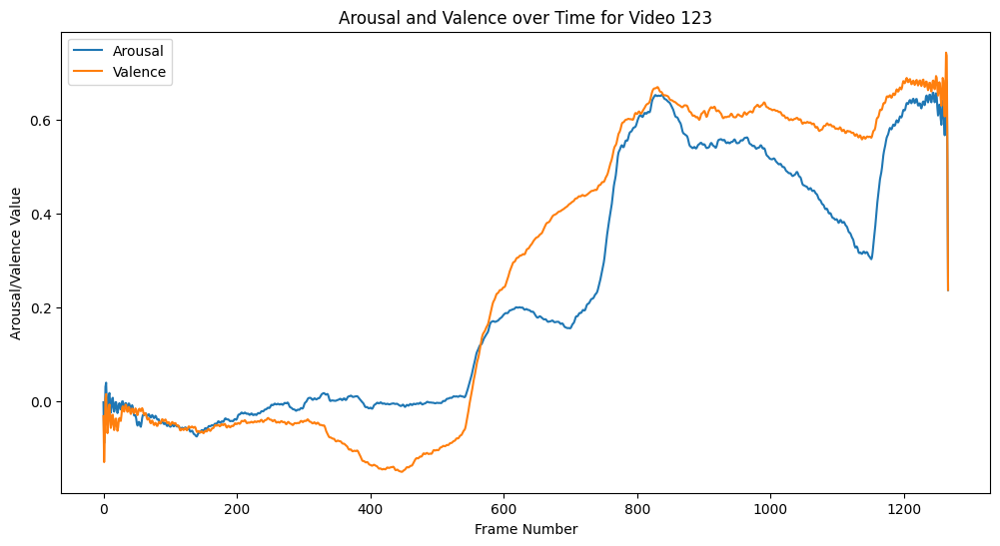

In [16]:
import matplotlib.pyplot as plt

# Iterate through video files
for i in range(len(os.listdir(file_path_videos))):
    video_filename = f"{i}.mp4"
    arousal_filename = f"{i}_arousal.csv"
    valence_filename = f"{i}_valence.csv"

    video_path = os.path.join(file_path_videos, video_filename)
    arousal_path = os.path.join(file_path_annotations, arousal_filename)
    valence_path = os.path.join(file_path_annotations, valence_filename)

    try:
        # Read the arousal CSV without a header and assign column names
        arousal_df = pd.read_csv(arousal_path, header=None)
        arousal_df.columns = ['frame', 'arousal']
        # Read the valence CSV without a header and assign column names
        valence_df = pd.read_csv(valence_path, header=None)
        valence_df.columns = ['frame', 'valence']

        # Merge the arousal and valence dataframes on the 'frame' column
        combined_df = pd.merge(arousal_df, valence_df, on='frame', how='inner')

        # Create a new figure and axes for the plot
        fig, axes = plt.figure(figsize=(12, 6)), plt.axes()

        # Plot arousal and valence over time
        axes.plot(combined_df['frame'], combined_df['arousal'], label='Arousal')
        axes.plot(combined_df['frame'], combined_df['valence'], label='Valence')

        # Add title and labels
        axes.set_title(f"Arousal and Valence over Time for Video {i}")
        axes.set_xlabel("Frame Number")
        axes.set_ylabel("Arousal/Valence Value")

        # Add legend
        axes.legend()

        # Display the plot
        plt.show()

    except FileNotFoundError:
        print(f"Annotation file not found for video {i}: {arousal_filename} or {valence_filename}")
    except Exception as e:
        print(f"Error processing annotation files for video {i}: {e}")

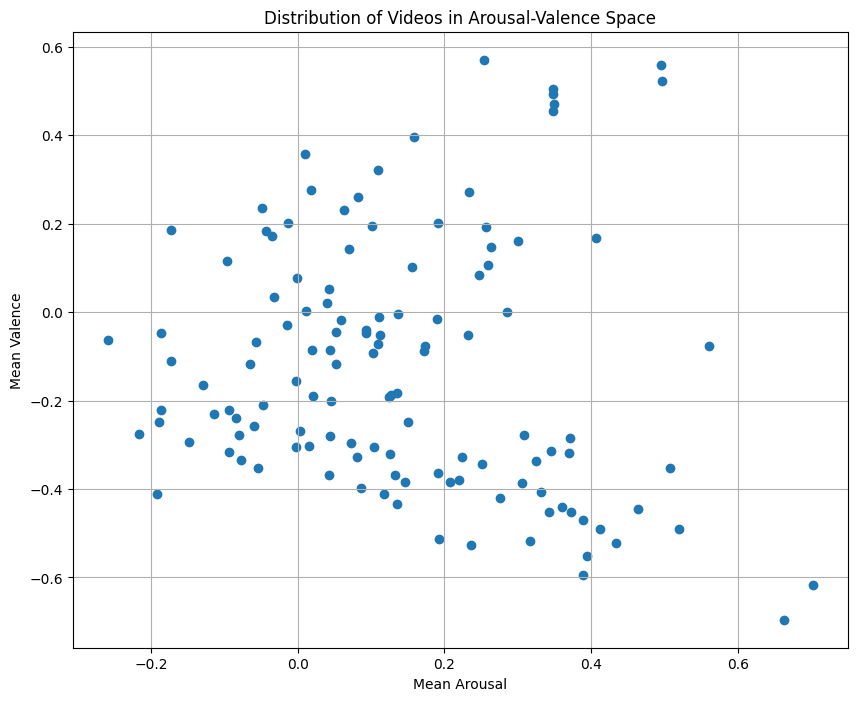


Number of videos in the 'Excited' quadrant (high arousal, high valence): 28

Overall mean arousal across all videos: 0.1406
Overall mean valence across all videos: -0.1273


In [19]:
# Analyze the distribution of videos based on mean arousal and valence
plt.figure(figsize=(10, 8))
plt.scatter(video_stats_df['mean_arousal'], video_stats_df['mean_valence']) # Swapped axes
plt.xlabel("Mean Arousal")  # Updated label
plt.ylabel("Mean Valence") # Updated label
plt.title("Distribution of Videos in Arousal-Valence Space")
plt.grid(True)
plt.show()

# Further analysis: Count videos in different quadrants or ranges
# You can define ranges for arousal and valence to count videos in specific emotional categories.
# For example, to count videos in the 'Excited' quadrant (high arousal, high valence):
excited_videos = video_stats_df[(video_stats_df['mean_arousal'] > 0) & (video_stats_df['mean_valence'] > 0)]
print(f"\nNumber of videos in the 'Excited' quadrant (high arousal, high valence): {len(excited_videos)}")

# Calculate overall mean arousal and valence
overall_mean_arousal = video_stats_df['mean_arousal'].mean()
overall_mean_valence = video_stats_df['mean_valence'].mean()

print(f"\nOverall mean arousal across all videos: {overall_mean_arousal:.4f}")
print(f"Overall mean valence across all videos: {overall_mean_valence:.4f}")